# Bin tag applier. 
This model implements the binary tagging model that was developed in notebook `/notebooks/machine learning notebooks/1 - usability tagger.ipynb`

Initially a single model was implemented without using a variable learning rate. The output of this model will be kept. There are three models (one model which was in there twice and has a sligthly lower treshold), which will be ran in this notebook. The cutoffpoint is not used to determine 1 or 0; in stead the certainty score will just be saved as a float - if needed, you can always change the way you query to get a higher or lower certainty. 

This shall be done for all three selected models. If need be, a boosting strategy can be applied later - but that's not within the current scope of the project. 

Data is stored in SQL so that we don't need to do the same constly computation over and over again (the first model needed 8 hours to process the whole dataset. I dread to imagine how long this will take.)

In [ ]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import os
import sys
import re
from tqdm import tqdm


sys.path.append('../../utils')
import config_handling as conf
from database import Database
from file_io import path_handler
import implot
import cnn_helpers

2025-02-22 12:12:57.024669: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
# Load configuration
#TODO config and Database should be re-implemented
config = conf.read_config('../../config/automotive.conf.ini')
config.read('config.ini')
connection_type = config['settings']['connection']
user = config[connection_type]['user']
pw = config[connection_type]['pw']
host = config[connection_type]['host']
db = config[connection_type]['db']
port = config[connection_type].getint('port')
db = Database(host,
              port,
              user,
              pw,
              db
              )
db.connect()

# Image directory
basedir = config['settings']['image_directory']

Connection established


In [3]:
#model1 was found using a static LR in a grid of 0.01. It's not concidered a serious contender at the moment. 
#  best_model-Epochs=5-raster=64-bbox=True.keras 
#   Epochs = 5
#   gridsize = 64
#   BBOX = True         
#Notice that having a variable learning rate to test for in a grid, came up with a bunch of models that are all better than models with LR 0.01 AND BBOX=True
table_query = """CREATE TABLE IF NOT EXISTS bintag_predicts (
    image_id INT PRIMARY KEY,
    model1_results FLOAT, 
    model2_results FLOAT, 
    model3_results FLOAT,
    model4_results FLOAT
);"""
db.execute_query(table_query)
#Model 2,3,4 will just follow the order of the dumped CSV file in bintag/models 

[]

In [4]:
batch_size = 5000

In [5]:
img_query = "SELECT * FROM images;"
img_table = pd.DataFrame(db.execute_query(img_query))

In [6]:
print(len(img_table))

15647260


In [7]:
cnn_helpers.system_override()
device = cnn_helpers.system_pick_device()

System override applied - check if GPU is detected
Using GPU for deep learning.


2025-02-22 12:14:55.829864: I external/local_xla/xla/stream_executor/rocm/rocm_executor.cc:920] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-02-22 12:14:58.249574: I external/local_xla/xla/stream_executor/rocm/rocm_executor.cc:920] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2025-02-22 12:14:58.249647: I external/local_xla/xla/stream_executor/rocm/rocm_executor.cc:920] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [8]:
img_table = img_table.fillna(-1)
img_table[['yolobox_top_left_x', 'yolobox_top_left_y', 'yolobox_bottom_right_x', 'yolobox_bottom_right_y']] = img_table[['yolobox_top_left_x', 'yolobox_top_left_y', 'yolobox_bottom_right_x', 'yolobox_bottom_right_y']].astype(int)
img_table['image_path'] = img_table['image_path'].apply(lambda x: path_handler(basedir, x))

/tmp/ipykernel_10638/3323961686.py:1: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  img_table = img_table.fillna(-1)


In [9]:
img_table.sample(5)

,id,listing_id,processed,use_image,certainty_of_outside_yolo,yolobox_top_left_x,yolobox_top_left_y,yolobox_bottom_right_x,yolobox_bottom_right_y,area,confidence,image_path
388907,638592,40744,1,0,-1,-1,-1,-1,-1,-1.0,-1.0,/home/frederic/Documents/automotive_image_data...
4882233,5131918,313585,1,0,-1,-1,-1,-1,-1,-1.0,-1.0,/home/frederic/Documents/automotive_image_data...
12228612,12888888,725145,1,0,-1,-1,-1,-1,-1,-1.0,-1.0,/home/frederic/Documents/automotive_image_data...
7760076,8420352,509857,1,0,-1,-1,-1,-1,-1,-1.0,-1.0,/home/frederic/Documents/automotive_image_data...
5534148,5783833,351563,1,0,-1,-1,-1,-1,-1,-1.0,-1.0,/home/frederic/Documents/automotive_image_data...


In [10]:
# it does not matter that we lose the data here for one treshold; this is a documented decision, it can be retrieved from the .csv file.
models = pd.read_csv('../../models/bin_models/chosen_models.csv')
models = models.drop_duplicates(subset=['BBOX', 'Rastersize', 'Epochs', 'Learningrate'])
models


,Treshold,BBOX,Rastersize,Epochs,Learningrate,Fractionsize,True_Negatives,True_Positives,False_Negatives,False_Positives,Precision,Recall,F1,FPR,TNR
0,0.75,False,128,20,0.0001,1.0,2464,1258,214,64,0.951589,0.854620,0.900501,0.025316,0.974684
1,0.50,False,128,10,0.0001,1.0,2401,1380,92,127,0.915727,0.937500,0.926485,0.050237,0.949763
2,0.90,False,64,5,0.0010,1.0,2447,1312,160,81,0.941852,0.891304,0.915881,0.032041,0.967959


In [11]:
models_to_columns = []
for idx, modelrow in models.iterrows():

    use_bbox = modelrow['BBOX']
    rastersize = modelrow['Rastersize']
    epochs = modelrow['Epochs']
    lr = modelrow['Learningrate']
    modelname = f'selected_model---Epochs={epochs}-raster={rastersize}-bbox={use_bbox}-learningrate={lr}.keras'
    model_dir = os.path.join(os.getcwd(), '../../models/bin_models')
    sql_col_name = f"model{idx+2}_results"  #+2 because model1 is used from earlier attempt (let's keep the result)
    models_to_columns.append([modelname, sql_col_name])
    #check if this columns is comlete or not, if it is, skip it: 
    completeness_query = f"select count(*) as remaining from bintag_predicts where {sql_col_name} is null"
    remaining = db.execute_query(completeness_query)
    if remaining[0]['remaining'] == 0: 
        print('SKIPPING (collumn completed) ', modelname, ' into ', sql_col_name)
        continue
    print('loading ', modelname, ' into ', sql_col_name)
    model = load_model(os.path.join(model_dir, modelname))
    completed_images = f"select image_id from bintag_predicts where {sql_col_name}  is not null;"
    done = db.execute_query(completed_images)
    completed = [x['image_id'] for x in done]
    for start in range(0, len(img_table), batch_size): 
        batch = img_table.iloc[start:start + batch_size]
        images = []
        pk_ids = batch['id']
        if bool(completed): 
            if max(pk_ids) < max(completed)-batch_size:
                continue
        for _, row in batch.iterrows():
            bbox = (row['yolobox_top_left_x'], row['yolobox_top_left_y'], row['yolobox_bottom_right_x'], row['yolobox_bottom_right_y'])
            img = cnn_helpers.preprocess_image(row['image_path'], use_bbox, bbox, rastersize)
            images.append(img)
        images = np.array(images)
        predictions = model.predict(images)
        batch_df = pd.DataFrame({
            'id' : pk_ids.values, 
            'predictions' : predictions.flatten()
        })
        update_query = f"""UPDATE bintag_predicts set {sql_col_name} = %s WHERE image_id = %s """
        for _, row in batch_df.iterrows(): 
            db.execute_query(update_query, [row['predictions'], row['id']])

        # Commit and close connection
        db.commit_transaction()
mod_cols = pd.DataFrame(models_to_columns)

SKIPPING (collumn completed)  selected_model---Epochs=20-raster=128-bbox=False-learningrate=0.0001.keras  into  model2_results
SKIPPING (collumn completed)  selected_model---Epochs=10-raster=128-bbox=False-learningrate=0.0001.keras  into  model3_results
SKIPPING (collumn completed)  selected_model---Epochs=5-raster=64-bbox=False-learningrate=0.001.keras  into  model4_results


In [12]:
mod_cols

,0,1
0,selected_model---Epochs=20-raster=128-bbox=Fal...,model2_results
1,selected_model---Epochs=10-raster=128-bbox=Fal...,model3_results
2,selected_model---Epochs=5-raster=64-bbox=False...,model4_results


In [13]:
#check how good your predictions are by inspecting a random grid of results: 
#SMALL NOTICE: Here we apply a treshold of 0.9 

query = """SELECT * 
        FROM images 
        JOIN bintag_predicts 
            ON bintag_predicts.image_id = images.id
        WHERE 
            bintag_predicts.model4_results >= 0.9
        ORDER BY RAND()
        LIMIT 10000

        """

prediction_data = pd.DataFrame(db.execute_query(query))
prediction_data['image_path'] = prediction_data['image_path'].apply(lambda x: path_handler(basedir, x))


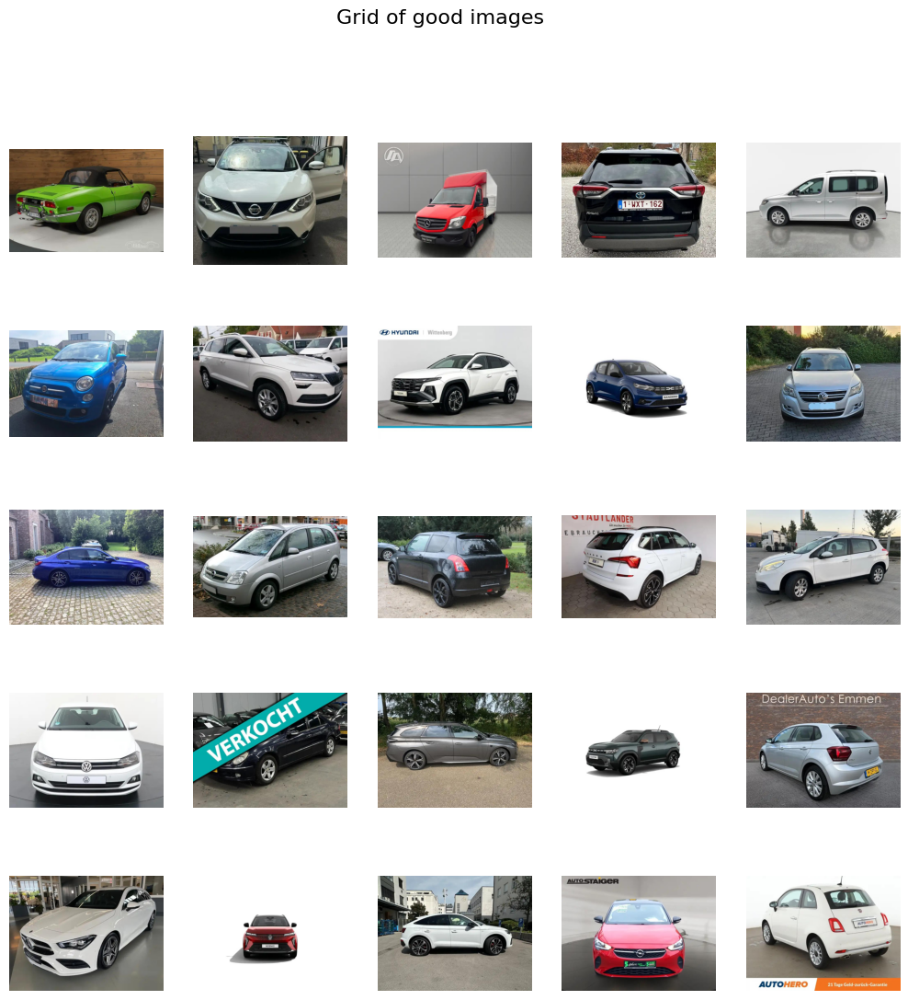

In [14]:
implot.plot_images_as_grid(prediction_data['image_path'], 'Grid of good images',5)

How's the certainty distributed across models?

In [15]:
spread = {}
for i in range(1, 5):
    print(i)
    percentile_distribution_query = f"""SELECT
                                        block_start,
                                        COUNT(*) AS f
                                    FROM (
                                        SELECT
                                            FLOOR(model{i}_results / 0.01) * 0.01 AS block_start
                                        FROM bintag_predicts
                                        WHERE model{i}_results >= 0 AND model{i}_results < 1
                                    ) AS subquery
                                    GROUP BY block_start
                                    ORDER BY block_start;"""
    distr = db.execute_query(percentile_distribution_query)
    spread[i]  = distr


1
2
3
4


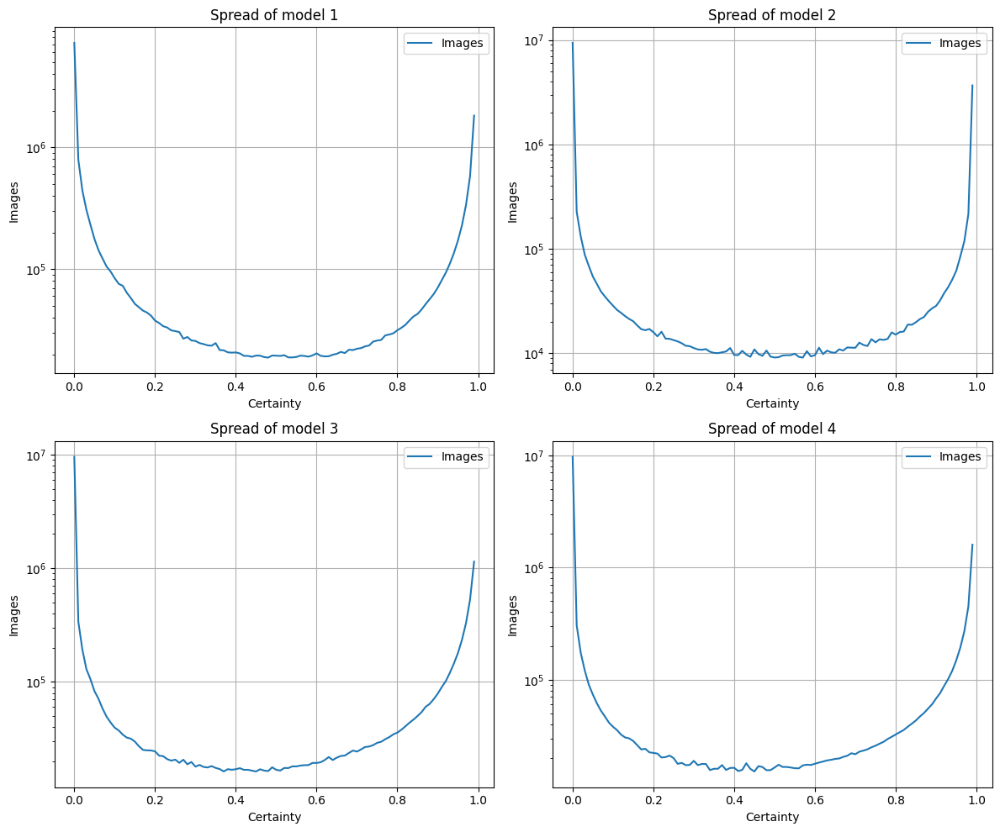

In [16]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, key in enumerate(spread.keys()):
    data = spread[key]
    block_start = [item['block_start'] for item in data]
    f_values = [item['f'] for item in data]
    
    axes[i].plot(block_start, f_values, label=f"Images")
    axes[i].set_title(f"Spread of model {key}")
    axes[i].set_xlabel('Certainty')
    axes[i].set_ylabel('Images')
    axes[i].grid(True)
    axes[i].set_yscale('log')
    axes[i].legend()

plt.tight_layout()

In [17]:
diff_query = """
                SELECT *
                FROM bintag_predicts
                JOIN images ON images.id = bintag_predicts.image_id
                WHERE 
                    GREATEST(model1_results, model2_results, model3_results, model4_results) - 
                    LEAST(model1_results, model2_results, model3_results, model4_results) >= 0.5
                AND
                    GREATEST(model1_results, model2_results, model3_results, model4_results) >= 0.9
                ;
            """

diffs = db.execute_query(diff_query)

In [18]:
diff_df = pd.DataFrame(diffs)
diff_df['image_path'] = diff_df['image_path'].apply(lambda x: path_handler(basedir, x))


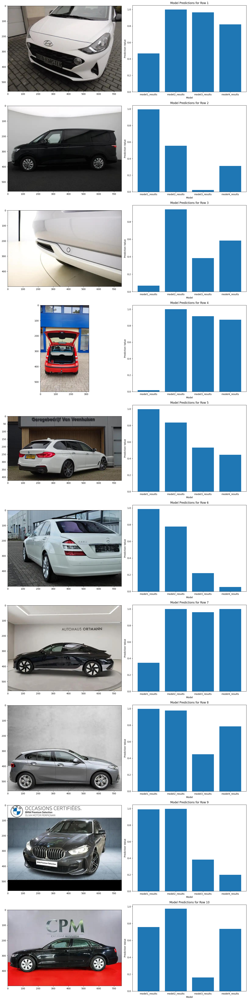

In [27]:
modelnames = ["model1_results", "model2_results", "model3_results", "model4_results"]
implot.plot_discord(diff_df, 10, modelnames)

## Intermodel confusion: 
How confused are the different models? 


In [20]:
intermodel_confusion_query = """
                SELECT 
                    bintag_predicts.*, 
                    images.image_path,
                    GREATEST(model1_results, model2_results, model3_results, model4_results) AS maxguess,
                    LEAST(model1_results, model2_results, model3_results, model4_results) AS minguess
                FROM bintag_predicts
                JOIN images ON images.id = bintag_predicts.image_id
                ;
            """
guess_distr = db.execute_query(intermodel_confusion_query)

In [21]:
guess_spread_df = pd.DataFrame(guess_distr)
guess_spread_df['diff'] = guess_spread_df['maxguess'] - guess_spread_df['minguess']
guess_spread_df['image_path'] = guess_spread_df['image_path'].apply(lambda x: path_handler(basedir, x))


''

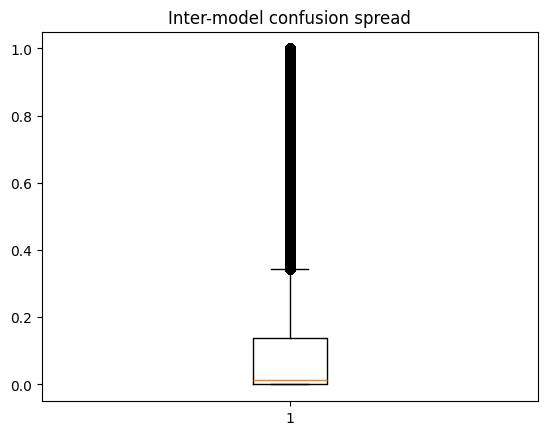

In [22]:
plt.boxplot(guess_spread_df['diff'])
plt.title('Inter-model confusion spread')
;

''

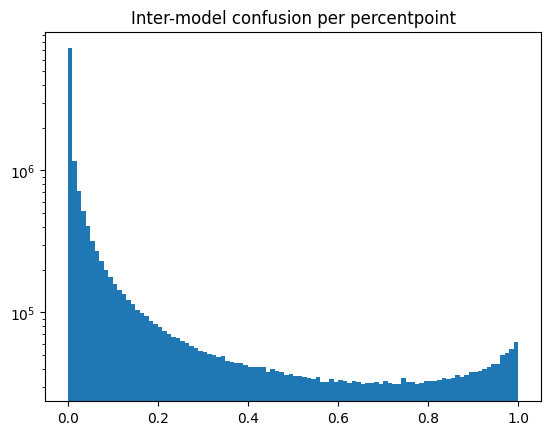

In [23]:
plt.hist(guess_spread_df['diff'], bins=100)
plt.title('Inter-model confusion per percentpoint')
plt.yscale('log')
;

Overall, there's not much discord between the models, we see however an uptick at 100% discord (so one of the four models saying 1 and one other saying 0). That is slightly annoying. 

In [24]:
max(guess_spread_df['diff']) # ??!!
#what images are these???


0.999999999836022

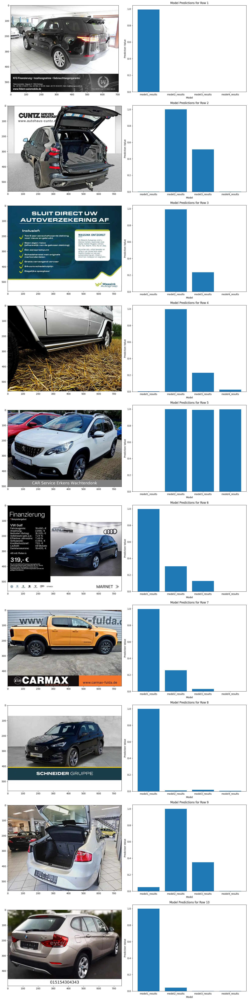

In [28]:
implot.plot_discord(guess_spread_df.query('diff>0.99'), 10, modelnames)

most of the times our models are in agreement; we have a few images where there's discord between the models. Let's make a plot where we visualize the following: 
- of our training set that was manually tagged, how many False Positives do we have for a given cutoffpoint.
- of our training set that was manually tagged, how many False Negatives do we have for a given cutoffpoint.
- of our unseen data: how many images are usefull for a given cutoffpoint. 

We'll do this for all four models. Up until here we were looking at a model and would only consider a single model, we could just as well use a voting classifier - to be considered. 

In [29]:
#query teh full training data: 
training_data_query = "SELECT image_id, angle FROM angletags WHERE manual_annotation = 1;"
training_data = db.execute_query(training_data_query)
training_data_df = pd.DataFrame(training_data)
training_data_df['good'] = (training_data_df['angle'] != 'crappy').astype(int)
training_data_df[['model1', 'model2', 'model3', 'model4'] ]= guess_spread_df[['model1_results', 'model2_results', 'model3_results', 'model4_results']]# based on guess_spread_df['image_id'] == training_data_df['image_id']

In [30]:
guess_spread_df.sample(5)

,image_id,model1_results,model2_results,model3_results,model4_results,image_path,maxguess,minguess,diff
10091497,10751773,0.000020,4.096550e-07,2.385280e-05,6.232110e-09,/home/frederic/Documents/automotive_image_data...,0.000024,6.232110e-09,0.000024
2470298,2719983,0.022722,1.668120e-05,1.078440e-03,4.225780e-04,/home/frederic/Documents/automotive_image_data...,0.022722,1.668120e-05,0.022706
8467168,9127444,0.999508,9.989550e-01,8.809570e-01,9.056800e-01,/home/frederic/Documents/automotive_image_data...,0.999508,8.809570e-01,0.118551
11422071,12082347,0.000156,2.150510e-03,1.012380e-04,1.034910e-05,/home/frederic/Documents/automotive_image_data...,0.002151,1.034910e-05,0.002140
12471525,13131801,0.000061,4.184700e-09,3.071550e-07,2.459770e-08,/home/frederic/Documents/automotive_image_data...,0.000061,4.184700e-09,0.000061


In [31]:
merged_df = training_data_df.merge(guess_spread_df[['image_id', 'model1_results', 'model2_results', 'model3_results', 'model4_results']], on='image_id', how='left')


In [32]:
merged_df

,image_id,angle,good,model1,model2,model3,model4,model1_results,model2_results,model3_results,model4_results
0,524,rearleft,1,0.099220,9.768380e-01,0.081617,0.636994,0.992064,9.999390e-01,9.792360e-01,9.947100e-01
1,1330,crappy,0,0.003413,2.607210e-05,0.000212,0.000439,0.000001,2.543980e-10,7.012900e-08,4.373270e-06
2,1974,rearright,1,0.001029,2.155890e-02,0.000808,0.000038,0.794712,9.963430e-01,4.331410e-01,4.040130e-03
3,2469,crappy,0,0.004945,1.004150e-10,0.000001,0.000001,0.115436,1.327630e-04,3.007820e-03,1.064090e-02
4,2510,crappy,0,0.000136,2.191950e-08,0.000027,0.000001,0.000001,8.818510e-12,1.071430e-08,8.263170e-09
...,...,...,...,...,...,...,...,...,...,...,...
19995,586504,crappy,0,0.306300,9.672950e-02,0.052375,0.137280,0.000243,7.944160e-05,6.147560e-04,6.321750e-03
19996,1222264,crappy,0,0.439171,9.737790e-01,0.584038,0.149454,0.048613,7.872640e-09,9.164960e-08,8.934220e-07
19997,1331406,crappy,0,0.982288,9.998820e-01,0.956050,0.925865,0.001290,1.416860e-08,5.101880e-07,2.551530e-06
19998,87577,crappy,0,0.003491,2.450960e-07,0.000052,0.000006,0.060050,1.473070e-03,2.329340e-03,1.145150e-03


In [33]:
results = {}
for model in ['model1_results',	'model2_results',	'model3_results',	'model4_results']:
    results[model] = {
        'cut' : [], 
        'fullset_usable' : [],
        'trainset_usable' : [], 
        'trainset_false_positives' : [],
        'trainset_false_negatives' : []
    }
    for cutoffpoint in tqdm(range(0,100)): 
        cutoffpoint = cutoffpoint/100
        results[model]['cut'].append(cutoffpoint)
        results[model]['fullset_usable'].append(sum(guess_spread_df[model] >= cutoffpoint))
        results[model]['trainset_usable'].append(sum(merged_df[model] >= cutoffpoint))
        results[model]['trainset_false_positives'].append(sum((merged_df[model] >= cutoffpoint) & (merged_df['good'] == 0)))
        results[model]['trainset_false_negatives'].append(sum((merged_df[model] < cutoffpoint) & (merged_df['good'] == 1)))



100%|██████████| 100/100 [00:58<00:00,  1.70it/s]


In [34]:
def find_index(valuelist, target):
    """
        returns the index of a list of values. The returned index is the biggest number that is smaller or equal to target
        parameters:
            valuelist = list of values
            target = float or int to match against
        returns:
            index of valuelist of the biggest value that is smaller or equal to target. 
    """
    valid_values = [num for num in valuelist if num <= target]
    max_value = max(valid_values)
    return valuelist.index(max_value)

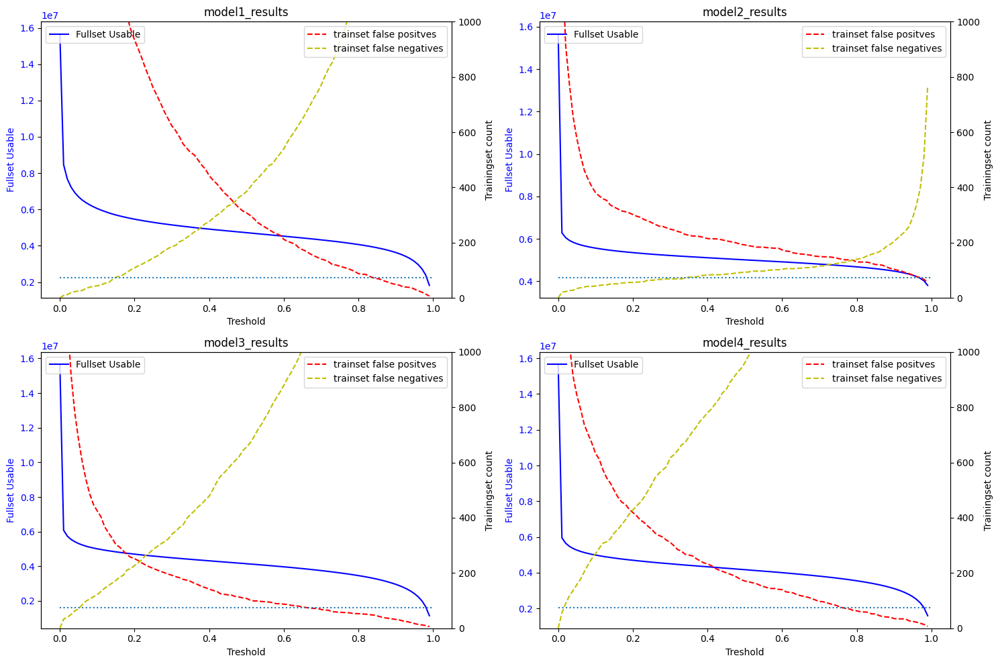

In [35]:
fig, axs = plt.subplots(2, 2, figsize=(15, 10))
hr = merged_df.good.sum()/100
# Loop through the axes and plot each model's data
for i, (model_name, ax) in enumerate(zip(results.keys(), axs.flatten())):
    model_data = results[model_name]
    ax.set_title(model_name)
    
    # left y-axis
    ax.plot(model_data['cut'], model_data['fullset_usable'], label='Fullset Usable', color='b')
    ax.set_xlabel('Treshold')
    ax.set_ylabel('Fullset Usable', color='b')  #yaxis has same color as plotted line!!!
    ax.tick_params(axis='y', labelcolor='b')

    # right y-axis
    ax2 = ax.twinx()
    #ax2.plot(model_data['cut'], model_data['trainset_usable'], label='trainset total usable', color='g', linestyle='--')
    ax2.plot(model_data['cut'], model_data['trainset_false_positives'], label='trainset false positves', color='r', linestyle='--')
    ax2.plot(model_data['cut'], model_data['trainset_false_negatives'], label='trainset false negatives', color='y', linestyle='--')
    ax2.set_ylabel('Trainingset count', color='k')
    ax2.tick_params(axis='y', labelcolor='k')
    ax2.set_ylim(0,1000)
    #ax2.set_yscale('log')  #graph is a bit harder to understand, but shows the differences more clearly
    #this is acceptable; if you are at the level of explaining false pos, true pos.... train-full set...  then people should know a log
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

    #add a horizontal line at the 1%mark with ...
    ax2.hlines(hr, 0, 1, linestyles='dotted')

fig.tight_layout()

In [36]:
for model_name, results_data in results.items(): 
    idx_one_pct = find_index(results_data['trainset_false_positives'], hr) #where's the one percent index in false positives
    volume_at_one_pct = results_data['fullset_usable'][idx_one_pct]
    cut_at_one_pct = results_data['cut'][idx_one_pct]
    print(f"{model_name} has a trainable datavolume of {volume_at_one_pct} at a treshold of {cut_at_one_pct} with one percent false positives")


model1_results has a trainable datavolume of 3930822 at a treshold of 0.84 with one percent false positives
model2_results has a trainable datavolume of 4018000 at a treshold of 0.98 with one percent false positives
model3_results has a trainable datavolume of 3821039 at a treshold of 0.67 with one percent false positives
model4_results has a trainable datavolume of 3638684 at a treshold of 0.77 with one percent false positives


Model 2 seems not that great on the graph, it looks like there's a very high rate of false positives all the way until the end of the curve. All models have quite a lot of false negatives; that's not a thing I really care about - at this stage, the data has to be cleaned. However when using the index lookup method; we see that model2 actually got the best performance (model2 was the most complex algorithm with 20 epochs, a learning rate of 0.0001, gridsize of 128**2 and no BBOX)

One big remark when it comes to false positives: when tagging the data, some rules were applied: 
- Are all panels closed? <-- cars with an opened door, hood, trunk... all got tagged as unusable.
- Is the car complete? <-- cars with missing parts (bumper, doors,...) all got tagged as unusable.
- Is the car completely on the picture <-- pictures with a minor part of the car cut off got tagged as unusable. 

It is very well possible, the models did not pick up on these nuances well enough. We could use a GradCam on problematic images to investigate further. Given the fact that there are still a few million images left, this is not a wise investment of resources. We'll not use a voting classifier either; as this is a typical boosting method and boosting should not be used here (the data is not independent and the models are the same). Boosting should typically be used when either of the next is true: 
1) Indepenedent data (model 1 is trained on different data than model 2 etc...) <-> ALL Models were traine on the same trainingset. 
2) Different Models (model 1 is of a different type than model 2 etc... ) <-> ALL CNN models with different hyperparamters. 

ALSO: notice the immense amount of false negatives; we retain about one in four images - which is less than our EDA would have led to suggest. again, this is not a problem worth losing time over 4.000.000 remaining images is still plenty. Since we have the probability stored in SQL, and not a binary tag, we can make a voting classifier on top of those results and see if it performs better than model 2. We can use the ```merged_df``` dataframe as this holds all data we need for a voting classifier.

What we'll do in stead is put a treshold of 0.9; an image is consered 'usable' if two or more models have a score of 0.9 or higher. We'll use MYSQL's query abilities to extract this data. We choose 0.84 as this should return in a model with less than one percent false positives. 

### Combining two models: 
we choose ANY combination of two models that have a certainty score of 0.9 or higher.

In [ ]:
final_cutoff = 0.9
multi_model_cutoff_query_training = f"""
    SELECT angletags.*, images.image_path as path
    FROM angletags
    JOIN images ON images.id = angletags.image_id
    JOIN bintag_predicts ON bintag_predicts.image_id = angletags.image_id
    WHERE 
        (CASE WHEN model1_results >= {final_cutoff} THEN 1 ELSE 0 END + 
        CASE WHEN model2_results >= {final_cutoff} THEN 1 ELSE 0 END + 
        CASE WHEN model3_results >= {final_cutoff} THEN 1 ELSE 0 END + 
        CASE WHEN model4_results >= {final_cutoff} THEN 1 ELSE 0 END)
    >= 2;
    """
selectiondata = db.execute_query(multi_model_cutoff_query_training)
selectiondf = pd.DataFrame(selectiondata)

In [ ]:
selectiondf['image_path'] = selectiondf['path'].apply(lambda x: path_handler(basedir, x))
selectiondf.sample(5)

,image_id,angle,manual_annotation,pk,path,image_path
2254,1304379,front,1,6605,kia\Rio\18481cb8-285e-4262-9819-036f134bb746\4...,/home/frederic/Documents/automotive_image_data...
5390,797365,right,1,16290,mercedes-benz\CLA (alle)\8d4c7b44-6938-4f27-88...,/home/frederic/Documents/automotive_image_data...
806,1029074,rear,1,2373,peugeot\208\5d56001d-dc7f-4e8f-ad13-891ecfa669...,/home/frederic/Documents/automotive_image_data...
4970,704953,frontright,1,14960,mercedes-benz\A-Klasse (alle)\ff79cca3-a8b1-49...,/home/frederic/Documents/automotive_image_data...
5478,1505890,right,1,16571,bmw\X Reeks (alle)\10288828-de00-4fbd-b36f-e70...,/home/frederic/Documents/automotive_image_data...


In [68]:
len(selectiondf)

6493

In [ ]:
selectiondf.angle.value_counts()
#46 crappy images; let's investigate: NOTICE that this is now 46 crappy outof 6493 images!! -> 0.708% 

angle
frontleft     1337
frontright     980
rearright      916
rearleft       876
front          802
rear           657
right          452
left           427
crappy          46
Name: count, dtype: int64

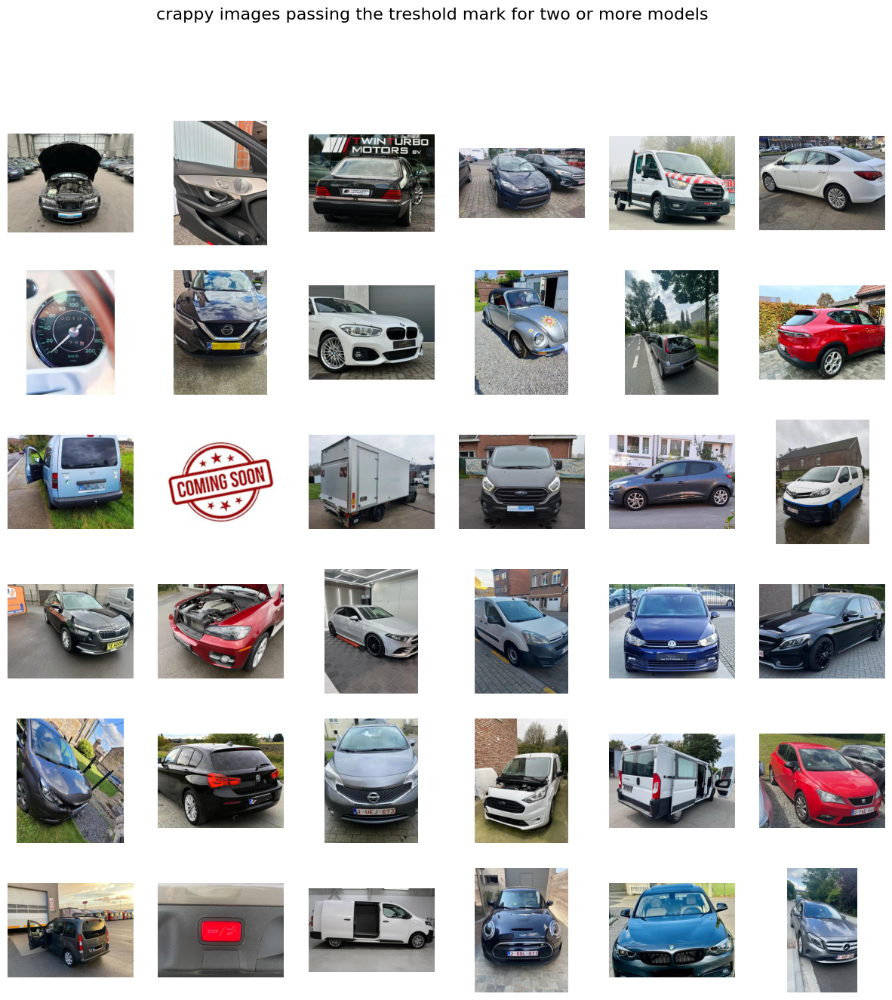

In [ ]:
implot.plot_images_as_grid(selectiondf.query('angle=="crappy"')['image_path'], 'crappy images passing the treshold mark for two or more models', 6)
#the bintag applier did not pick up so well on images where parts are missing/damaged
#it failed to learn to ignore cars with open panels
#or where parts fot he car are cut off - however in all honesty, even with these crappy images it is still posible to identify the cars most of the times. 
# we also see taht in some cases a car was marked as crappy but it shouldn't have been (or it is very debatable) so the 0.708% is even an overestimate. 

In [72]:
multi_model_cutoff_query_full = f"""
    SELECT *
    FROM images
    JOIN bintag_predicts ON bintag_predicts.image_id = images.id
    WHERE 
        (CASE WHEN model1_results >= {final_cutoff} THEN 1 ELSE 0 END + 
        CASE WHEN model2_results >= {final_cutoff} THEN 1 ELSE 0 END + 
        CASE WHEN model3_results >= {final_cutoff} THEN 1 ELSE 0 END + 
        CASE WHEN model4_results >= {final_cutoff} THEN 1 ELSE 0 END)
    >= 2;
    """
fulldata = db.execute_query(multi_model_cutoff_query_full)
fulldf = pd.DataFrame(fulldata)

In [ ]:
len(fulldf)
#just under 4million images to use  GOOD ENOUGH this concludes phase 1: bintagging. 
#next phase Angle tagging. 

3990872